In [ ]:
%pip install captum
%pip install Flask-Compress
%pip install pytorch-lightning
%pip install torchinfo

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch.nn as nn
import torch

import torchvision
from torchvision import transforms

import torch.optim as optim

from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset, DataLoader

from random import randint

import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export

import pytorch_lightning as pl

import numpy as np

In [ ]:
from google.colab import drive

drive.mount("/content/drive", force_remount=True)
%cd '/content/drive/My Drive/Colab Notebooks/Labs/Computer Vision/CAPTUM_methods'

Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks/Labs/Computer Vision/CAPTUM_methods


### Connect locally

In [ ]:
#%cd C:/Users/androgo/Documents/Python Scripts/myLabProject/Computer Vision/CAPTUM_methods


## The model for inference

In [ ]:
from torchvision.models import efficientnet_v2_s
from torchvision.models import EfficientNet_V2_S_Weights

# Initialize model
def get_model():
  weights = EfficientNet_V2_S_Weights.DEFAULT
  model = efficientnet_v2_s(weights=weights)
  model.eval()

  # Initialize inference transforms
  auto_transforms = weights.transforms()

  return model, auto_transforms

In [ ]:
model, auto_transforms = get_model()
print('The inout of the model are transformed with: ')
auto_transforms

Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth


  0%|          | 0.00/82.7M [00:00<?, ?B/s]

The inout of the model are transformed with: 


ImageClassification(
    crop_size=[384]
    resize_size=[384]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

## Model pretrained

In [ ]:
from torchinfo import summary

summary(model, input_size=(8, 3, 180, 180),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [8, 3, 180, 180]     [8, 1000]            --                   True
├─Sequential (features)                                      [8, 3, 180, 180]     [8, 1280, 6, 6]      --                   True
│    └─Conv2dNormActivation (0)                              [8, 3, 180, 180]     [8, 24, 90, 90]      --                   True
│    │    └─Conv2d (0)                                       [8, 3, 180, 180]     [8, 24, 90, 90]      648                  True
│    │    └─BatchNorm2d (1)                                  [8, 24, 90, 90]      [8, 24, 90, 90]      48                   True
│    │    └─SiLU (2)                                         [8, 24, 90, 90]      [8, 24, 90, 90]      --                   --
│    └─Sequential (1)                                        [8, 24, 90, 90]      [8, 24, 90, 

### Datasets

In [ ]:
import matplotlib

def show_batch(dataloader, rows, columns, unormalize=False):
    data=iter(dataloader)
    fig = plt.figure(figsize=(18, 15))

    imgs, _ = data.next()

    for i in range(rows*columns):
        npimg=imgs[i].numpy()
        fig.add_subplot(rows, columns, i+1)

        npimg=np.transpose(npimg,(1,2,0))
        if not unormalize:
            plt.imshow(npimg)

        if unormalize:
            plt.imshow(npimg)
            plt.imshow(npimg, norm=matplotlib.colors.Normalize.
                                                autoscale(matplotlib.colors.Normalize,A=npimg)
                                               )

        plt.axis('off')
    plt.show()

### Check the images

In [ ]:
batch_size=8


train_dataset_raw = torchvision.datasets.OxfordIIITPet(
        root="Data",target_types='category', transform=transforms.Compose([ transforms.Resize(236),transforms.CenterCrop(228),transforms.ToTensor()]), download=True
    )

train_loader_raw = DataLoader(
        dataset=train_dataset_raw,
        batch_size=batch_size,
        shuffle=True
    )

dataset_labels=train_dataset_raw.class_to_idx.keys()
print('Categories of the dataset:\n',  ','.join(dataset_labels))


Categories of the dataset:
 Abyssinian,American Bulldog,American Pit Bull Terrier,Basset Hound,Beagle,Bengal,Birman,Bombay,Boxer,British Shorthair,Chihuahua,Egyptian Mau,English Cocker Spaniel,English Setter,German Shorthaired,Great Pyrenees,Havanese,Japanese Chin,Keeshond,Leonberger,Maine Coon,Miniature Pinscher,Newfoundland,Persian,Pomeranian,Pug,Ragdoll,Russian Blue,Saint Bernard,Samoyed,Scottish Terrier,Shiba Inu,Siamese,Sphynx,Staffordshire Bull Terrier,Wheaten Terrier,Yorkshire Terrier


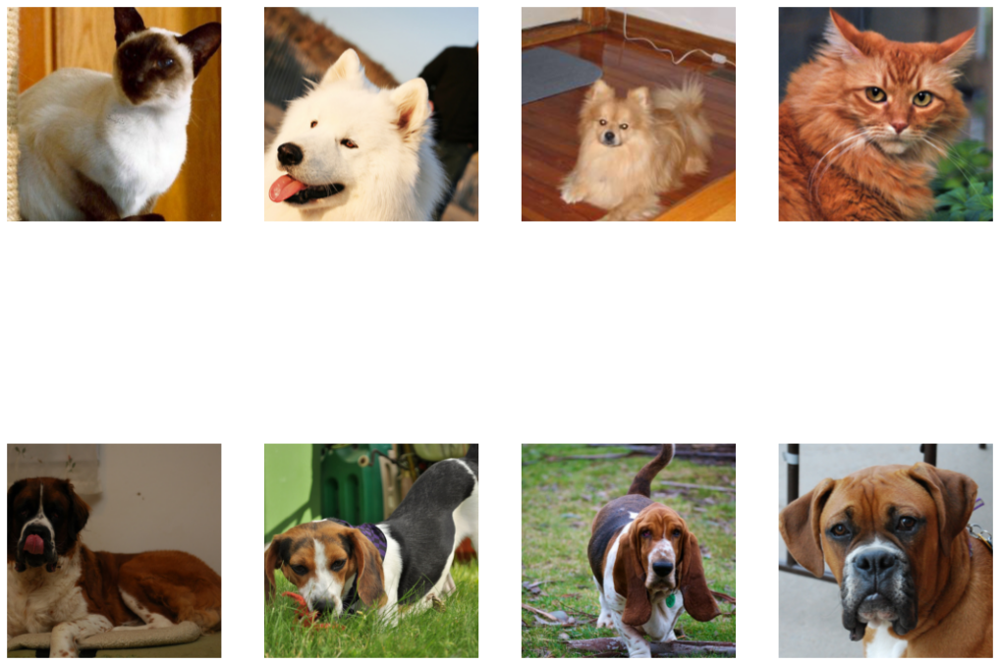

In [ ]:
show_batch(train_loader_raw, 2, 4)

In [ ]:

def get_train_loader(batch_size=32):
  # Apply transformations to the train dataset to mach the pretrained model
  train_transforms = auto_transforms

  train_dataset = torchvision.datasets.OxfordIIITPet(
          root="Data",target_types='category', transform=train_transforms, download=True
      )

  train_loader = DataLoader(
          dataset=train_dataset,
          batch_size=batch_size,
          shuffle=True
      )

  return train_loader


def get_test_loader(batch_size):
  test_transforms = transforms.Compose([
      transforms.Resize(384),
      transforms.CenterCrop(384),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

  ])

  test_dataset = torchvision.datasets.OxfordIIITPet(
          root="Data",split='test', transform=test_transforms, download=True
      )

  test_loader = DataLoader(
          dataset=test_dataset,
          batch_size=batch_size,
          shuffle=False
      )

  return test_loader

### Transfer learning

In [ ]:
# Set the manual seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)
#DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# Freeze all base layers in the "features" section of the model (the feature extractor) by setting requires_grad=False
BN_TYPES = (nn.BatchNorm1d, nn.BatchNorm2d, nn.BatchNorm3d)


def make_trainable(module):
    """Unfreezes a given module.
    Args:
        module: The module to unfreeze
    """
    for param in module.parameters():
        param.requires_grad = True
    module.train()


def _recursive_freeze(module):
    """Freezes the layers of a given module.
    Args:
        module: The module to freeze
        train_bn: If True, leave the BatchNorm layers in training mode
    """
    children = list(module.children())
    if not children:
        if not (isinstance(module, BN_TYPES)):
            for param in module.parameters():
                param.requires_grad = False
            module.eval()
        else:
            # Make the BN layers trainable to keep mean and std
            #_make_trainable(module)
            # Make the BN layers freezed
            for param in module.parameters():
                param.requires_grad = False
            module.eval()
    else:
        for child in children:
            _recursive_freeze(module=child)


def freeze(module):
    children = list(module.children())

    for child in children:
        _recursive_freeze(module=child)

In [ ]:

# Get the length of class_names
number_classes = len(dataset_labels)

model,_ = get_model()

model.eval()
freeze(model)
# Recreate the classifier layer and seed it to the target device
model.classifier = torch.nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(in_features=1280,
                    out_features=number_classes, # same number of output units as our number of classes
                    bias=True))

make_trainable(model.classifier)


In [ ]:

# Do a summary *after* freezing the features and changing the output classifier layer
summary(model,
        input_size=(8, 3, 384, 384),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=['depth',"var_names"],
        mode='train'
)

Layer (type (var_name):depth-idx)                                 Input Shape          Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                       [8, 3, 384, 384]     [8, 37]              --                   Partial
├─Sequential (features): 1-1                                      [8, 3, 384, 384]     [8, 1280, 12, 12]    --                   False
│    └─Conv2dNormActivation (0): 2-1                              [8, 3, 384, 384]     [8, 24, 192, 192]    --                   False
│    │    └─Conv2d (0): 3-1                                       [8, 3, 384, 384]     [8, 24, 192, 192]    (648)                False
│    │    └─BatchNorm2d (1): 3-2                                  [8, 24, 192, 192]    [8, 24, 192, 192]    (48)                 False
│    │    └─SiLU (2): 3-3                                         [8, 24, 192, 192]    [8, 24, 192, 192]    --                   --
│    └─Sequential (1): 2-2                          

In [ ]:
test_loader=get_test_loader(batch_size=16)
train_loader=get_train_loader(batch_size=16)

print('test loader lenghth', len(test_loader))
print('train loader lenghth', len(train_loader))
images, labels = next(iter(train_loader))
images.shape

test loader lenghth 230
train loader lenghth 230


torch.Size([16, 3, 384, 384])

### Use pytorch lighting to encapsulate the datasets

In [ ]:
from torchmetrics.functional  import classification

# Setting the seed
pl.seed_everything(42)

model_dict = {}
model_dict['efficient_net'] = model

def create_model(model_name):
     return model_dict[model_name]


class OxfordIIITPetModule(pl.LightningModule):
    def __init__(self, model_name,  optimizer_name, optimizer_hparams):
        """
        Inputs:
            model_name - Name of the model/CNN to run. Used for creating the model (see function below)
            optimizer_name - Name of the optimizer to use. Currently supported: Adam, SGD
            optimizer_hparams - Hyperparameters for the optimizer, as dictionary. This includes learning rate, weight decay, etc.
        """
        super().__init__()

        # Exports the hyperparameters to a YAML file, and create "self.hparams" namespace
        self.save_hyperparameters()
        # Create model
        self.model = create_model(model_name)
        # Create loss module
        self.loss_module = nn.CrossEntropyLoss()
        self.learning_rate = self.hparams.optimizer_hparams["lr"]

        # Example input for visualizing the graph in Tensorboard
        self.example_input_array = torch.zeros((1, 3, 32, 32), dtype=torch.float32)

    def forward(self, imgs):
        # Forward function that is run when visualizing the graph
        return self.model(imgs)

    def configure_optimizers(self):
        # We will support Adam or SGD as optimizers.
        if self.hparams.optimizer_name == "AdamW":
            #optimizer = optim.AdamW(self.parameters(), **self.hparams.optimizer_hparams)
            optimizer = optim.AdamW(filter(lambda p: p.requires_grad, self.parameters()),
                                   lr=self.learning_rate)

        elif self.hparams.optimizer_name == "SGD":
            optimizer = optim.SGD(filter(lambda p: p.requires_grad, self.parameters()),
                                   lr=self.lr)
        else:
            assert False, f'Unknown optimizer: "{self.hparams.optimizer_name}"'

        #scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100, 150], gamma=0.1)
        #scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0 =10)

        #return [optimizer], [scheduler]

        return {
        "optimizer": optimizer,
        "lr_scheduler": {
            "scheduler": optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0 =10),
            "interval": "step",
            "frequency": 30

        }
    }

    def training_step(self, batch, batch_idx):
        # "batch" is the output of the training data loader.
        imgs, labels = batch
        preds = self.model(imgs)
        loss = self.loss_module(preds, labels)
        acc = classification.accuracy(preds,labels, task="multiclass",num_classes=number_classes)
        # Logs the accuracy per epoch to tensorboard (weighted average over batches)
        self.log("train_acc", acc, on_step=True, on_epoch=True, prog_bar=True)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True)


        return loss

    def test_step(self, batch, batch_idx):
        imgs, labels = batch
        preds = self.model(imgs)
        acc = classification.accuracy(preds, labels, task="multiclass", num_classes=number_classes)
        self.log("test_acc", acc, on_step=True, on_epoch=True, prog_bar=True)

    def validation_step(self, batch, batch_idx):
        imgs, labels = batch
        preds = self.model(imgs)
        acc = classification.accuracy(preds,labels, task="multiclass", num_classes=number_classes)
        self.log("val_acc", acc, on_step=True, on_epoch=True, prog_bar=True)

INFO:lightning_lite.utilities.seed:Global seed set to 42


### Training module

In [ ]:
import random
import os

# Function for setting the seed
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
set_seed(3407)
pl.seed_everything(3407) # To be reproducible

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = True

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
accelerator="gpu" if str(device).startswith("cuda") else "cpu"

# Path to the folder where the pretrained models are saved
CHECKPOINT_PATH = "./saved_models"
# Create checkpoint path if it doesn't exist yet
os.makedirs(CHECKPOINT_PATH, exist_ok=True)


INFO:lightning_lite.utilities.seed:Global seed set to 42


In [ ]:
%load_ext tensorboard
%tensorboard --logdir ./tensorboard_logs/efficient_net/

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import os
from pytorch_lightning.callbacks import LearningRateFinder, LearningRateMonitor, ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger


model_name = 'efficient_net'
optimizer_name="AdamW"
optimizer_hparams={"lr": 1e-3,  "weight_decay": 1e-4}


save_name = 'efficient_net'

logger = TensorBoardLogger(save_dir="tensorboard_logs", name=save_name,log_graph=True)

# Create a PyTorch Lightning trainer with the generation callback
trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, save_name),
                      accelerator=device.type,
                      devices=1,
                      max_epochs=4,
                      auto_lr_find=True,
                      callbacks=[ModelCheckpoint(dirpath= os.path.join(CHECKPOINT_PATH, save_name, 'model_checkpoint'), save_weights_only=True, mode="max", monitor="val_acc",save_last=True),
                                LearningRateMonitor(logging_interval="step")
                                #LearningRateFinder(min_lr=1e-04, max_lr=1e-01, num_training_steps=50,update_attr=True)
                                ],
                      enable_progress_bar=True,
                      logger=logger)
trainer.logger._log_graph = True         # If True, we plot the computation graph in tensorboard
trainer.logger._default_hp_metric = None # Optional logging argument that we don't need


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [ ]:
# Check whether pretrained model exists. If yes, load it and skip training
pretrained_filename = os.path.join(CHECKPOINT_PATH, save_name + ".ckpt")
if os.path.isfile(pretrained_filename):
    print(f"Found pretrained model at {pretrained_filename}, loading...")
    model = OxfordIIITPetModule.load_from_checkpoint(pretrained_filename) # Automatically loads the model with the saved hyperparameters
else:
    model = OxfordIIITPetModule(model_name=model_name,optimizer_name=optimizer_name,optimizer_hparams=optimizer_hparams)

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:604: UserWarning: Checkpoint directory /content/drive/My Drive/Colab Notebooks/Labs/Computer Vision/CAPTUM_methods/saved_models/efficient_net/model_checkpoint exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/1000 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=896` reached.
INFO:pytorch_lightning.tuner.lr_finder:LR finder stopped early after 896 steps due to diverging loss.
INFO:pytorch_lightning.tuner.lr_finder:Learning rate set to 0.04487453899331322
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at saved_models/efficient_net/.lr_find_370ca19b-e94a-4c95-ae51-0b681d49a8da.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint file at saved_models/efficient_net/.lr_find_370ca19b-e94a-4c95-ae51-0b681d49a8da.ckpt


new_lr:  0.04487453899331322


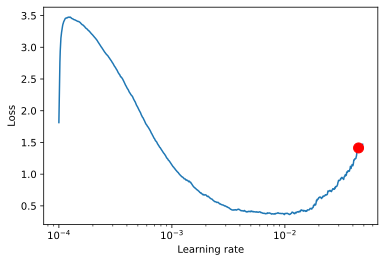

In [ ]:
# Run learning rate finder
lr_finder = trainer.tuner.lr_find(model=model, train_dataloaders=train_loader, val_dataloaders=test_loader,min_lr=1e-04, max_lr=1e-01, num_training=1000, update_attr=True)

# Results can be found in
#print(lr_finder.results)

# Pick point based on plot, or get suggestion
new_lr = lr_finder.suggestion()
print('new_lr: ',new_lr)

# Plot with
fig = lr_finder.plot(suggest=True)
fig.show()

### Train and test the model

In [ ]:
# update hparams of the model
model.hparams.optimizer_hparams["lr"] = new_lr

# Fit model
trainer.fit(model, train_loader, test_loader)
print('best_model_path: ', trainer.checkpoint_callback.best_model_path)
model = OxfordIIITPetModule.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training

# Test best model on validation and test set
test_result = trainer.test(model, test_loader, verbose=False)

/usr/local/lib/python3.8/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:604: UserWarning: Checkpoint directory /content/drive/My Drive/Colab Notebooks/Labs/Computer Vision/CAPTUM_methods/saved_models/efficient_net/model_checkpoint exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type             | Params | In sizes       | Out sizes
------------------------------------------------------------------------------
0 | model       | EfficientNet     | 20.2 M | [1, 3, 32, 32] | [1, 37]  
1 | loss_module | CrossEntropyLoss | 0      | ?              | ?        
------------------------------------------------------------------------------
47.4 K    Trainable params
20.2 M    Non-trainable params
20.2 M    Total params
80.900    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=4` reached.


best_model_path:  /content/drive/My Drive/Colab Notebooks/Labs/Computer Vision/CAPTUM_methods/saved_models/efficient_net/model_checkpoint/epoch=3-step=920.ckpt


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: 0it [00:00, ?it/s]

### Print best models info

In [ ]:
print(trainer.checkpoint_callback.best_model_path) #load this one
print(trainer.checkpoint_callback.best_model_score)
print(trainer.checkpoint_callback.best_k_models)

In [ ]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
#device = torch.device("cpu")

In [ ]:
trainer.checkpoint_callback.best_model_path

'/content/drive/My Drive/Colab Notebooks/Labs/Computer Vision/CAPTUM_methods/saved_models/efficient_net/model_checkpoint/epoch=3-step=920.ckpt'

In [ ]:
#load model from the path printed above after training
#model = OxfordIIITPetModule.load_from_checkpoint('/content/drive/MyDrive/Colab Notebooks/myLabProject/Computer Vision/saved_models/efficient_net/model_checkpoint/epoch=0-step=230.ckpt')
#this one does not works without training or not?????
model = OxfordIIITPetModule.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training
model.freeze()
model = model.to(device)
model.eval()

# Do a summary *after* freezing the features and changing the output classifier layer
summary(model,
        input_size=(8, 3, 384, 384),
        verbose=0,
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=['depth',"var_names"],
        mode='train'
)

Layer (type (var_name):depth-idx)                                      Input Shape          Output Shape         Param #              Trainable
OxfordIIITPetModule (OxfordIIITPetModule)                              [8, 3, 384, 384]     [8, 37]              --                   False
├─EfficientNet (model): 1-1                                            [8, 3, 384, 384]     [8, 37]              --                   False
│    └─Sequential (features): 2-1                                      [8, 3, 384, 384]     [8, 1280, 12, 12]    --                   False
│    │    └─Conv2dNormActivation (0): 3-1                              [8, 3, 384, 384]     [8, 24, 192, 192]    (696)                False
│    │    └─Sequential (1): 3-2                                        [8, 24, 192, 192]    [8, 24, 192, 192]    (10,464)             False
│    │    └─Sequential (2): 3-3                                        [8, 24, 192, 192]    [8, 48, 96, 96]      (303,552)            False
│    │    └─Sequ

### Use Captum

In [ ]:
import torch.nn.functional as F

import joblib
from PIL import Image
from matplotlib.colors import LinearSegmentedColormap

from captum.attr import IntegratedGradients, DeepLift, GradientShap, Occlusion
from captum.attr import visualization as viz

### Test loader without unnecesary transforamtions

In [ ]:
batch_size = 4
test_transforms = transforms.Compose([
      transforms.Resize((384, 384)),
      transforms.ToTensor()
  ])

test_dataset_raw = torchvision.datasets.OxfordIIITPet(
          root="Data",split='test', transform=test_transforms, download=True
      )

test_loader_raw = DataLoader(
        dataset=test_dataset_raw,
        batch_size=batch_size,
        shuffle=False
    )

ids_to_class_labels = {v: k for k, v in test_dataset_raw.class_to_idx.items()}

In [ ]:
random_image_to_pick=3
print('test loader lenghth: ', len(test_loader_raw))
images, labels = next(iter(test_loader_raw))
images.shape
image_xai, label_xai= images[random_image_to_pick], labels[random_image_to_pick]
image_xai, label_xai= image_xai.to(device), label_xai.to(device)


test loader lenghth:  918


In [ ]:
def get_input_image(image):
    mean, std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

    img_transforms = transforms.Compose([
            transforms.Normalize(mean, std, inplace=True)
        ])

    image = img_transforms(torch.clone(image))

    return image

def interpretation_transform(image):
    return torch.clone(image)

def predict_label(image, model=model):
    image = image.unsqueeze(0)
    image=image.to(device)
    # Get predictions from model
    _pred = model(image)
    # Pick index with highest probability
    output = F.softmax(_pred, dim=1)
    prediction_score, pred = torch.topk(output, 1)

    return pred.squeeze()

In [ ]:
transformed_img =  interpretation_transform(image_xai)
test_image =   get_input_image(image_xai)

pred_ix = predict_label(test_image)
interpretation_image = test_image.unsqueeze(0)


dataset_labels=test_dataset_raw.class_to_idx.keys()
_pred_ix = pred_ix.item()

pred_label=ids_to_class_labels[_pred_ix]
print('predicted label: ', pred_label)

predicted label:  Abyssinian


### IntegratedGradients

Integrated Gradients computes the integral of the gradients of the output prediction for the class index `pred_ix` with respect to the input image pixels along the path from the black image to our input image.

*Note: to compute integral, we need at least 5GB RAM available*

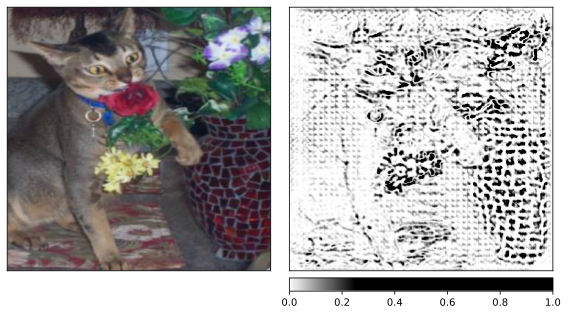

In [ ]:
integrated_gradients = IntegratedGradients(model)
attributions_ig = integrated_gradients.attribute(interpretation_image, target=pred_ix, n_steps=30)

default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

_ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                             np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                             methods=["original_image", "heat_map"],
                             cmap=default_cmap,
                             show_colorbar=True,
                             signs=["all", "positive"],
                             outlier_perc=1)

### GradientShap

GradientShap is a linear explanation model which uses a distribution of reference samples (in this case two images) to explain predictions of the model. It computes the expectation of gradients for an input which was chosen randomly between the input and a baseline. The baseline is also chosen randomly from given baseline distribution.

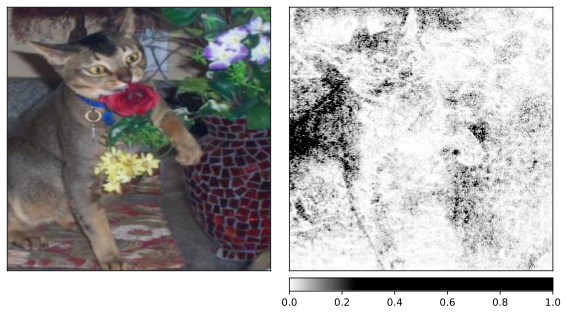

In [ ]:
gradient_shap = GradientShap(model)

# Defining baseline distribution of images
rand_img_dist = torch.cat([interpretation_image * 0, interpretation_image * 1])

attributions_gs = gradient_shap.attribute(interpretation_image,
                                          baselines=rand_img_dist,
                                          target=pred_ix)

_ = viz.visualize_image_attr_multiple(np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "absolute_value"],
                                      cmap=default_cmap,
                                      show_colorbar=True)

### DeepLift

Deeplift assigns attributions to each input pixel by looking at the differences of output and its reference in terms of the differences of the input from the reference.

In [ ]:
interpretation_image.requires_grad_(True)

/usr/local/lib/python3.8/dist-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/captum/attr/_core/deep_lift.py:336: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(


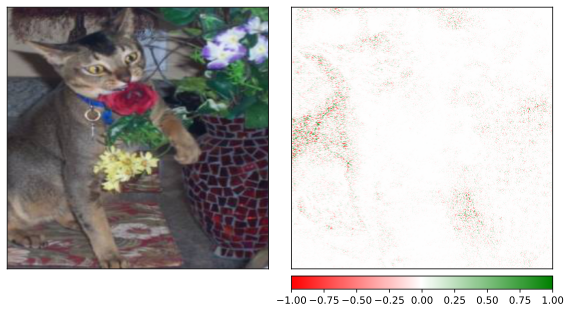

In [ ]:
dl = DeepLift(model)
attributions_dl = dl.attribute(interpretation_image,
                                baselines=interpretation_image*0,
                                target=pred_ix)
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_dl.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "all"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                     )

### Occlusion

Occlusion-based attribution: We can estimate which areas of the image are critical for the classifier's decision by occluding them and quantifying how the decision changes.

We run a sliding window of size 5x5 with a stride of 1 along both image dimensions. At each location, we occlude the image with a baseline value of 0 which correspondes to a gray patch.

*Note: this computation might take up to 20 minutes*

In [ ]:
interpretation_image.requires_grad_(False)
#interpretation_image.requires_grad

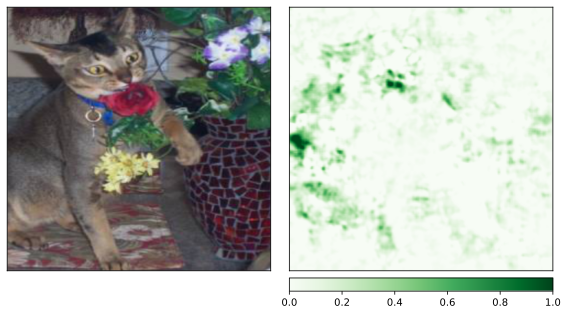

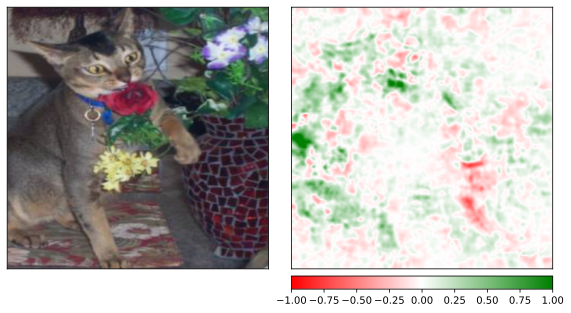

In [ ]:
occlusion = Occlusion(model)

attributions_occ = occlusion.attribute(interpretation_image,
                                       strides = (3, 1, 1),
                                       target=pred_ix,
                                       sliding_window_shapes=(3,5, 5),
                                       baselines=0)

_ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                     )
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      ["original_image", "heat_map"],
                                      ["all", "all"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                     )